In [1]:
import geopandas as gpd
import pydeck as pdk
import numpy as np

In [2]:
gdf = gpd.read_file("Porto_Alegre__Brasil_resolution_9.geojson").to_crs("EPSG:4326")
gdf["value"] = np.random.rand(len(gdf))
gdf.head()

,h,geometry,value
0,89a9013b24fffff,"POLYGON ((-51.12816 -30.23784, -51.12709 -30.2...",0.712971
1,89a90138e87ffff,"POLYGON ((-51.22629 -30.18105, -51.22523 -30.1...",0.563818
2,89a90166cb7ffff,"POLYGON ((-51.12023 -30.04181, -51.11916 -30.0...",0.507336
3,89a90e921cfffff,"POLYGON ((-51.22703 -29.97443, -51.22596 -29.9...",0.904019
4,89a90176ec7ffff,"POLYGON ((-51.08896 -30.17197, -51.08789 -30.1...",0.342679


<Axes: >

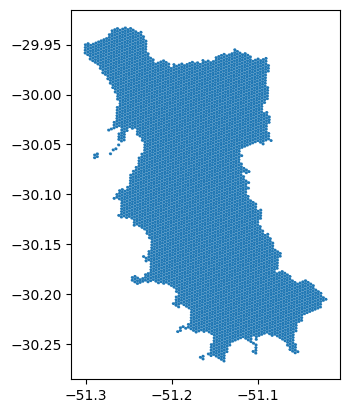

In [3]:
gdf.plot()

In [4]:
colors = [
    [26, 150, 65, 140],
    [166, 217, 106, 140],
    [253, 174, 97, 140],
    [215, 25, 28, 140],
]


def map_value_to_color(value, colors):
    index = int(value * (len(colors)))
    return colors[index]


def map_value_to_elevation(value, min_elevation=0, max_elevation=1000):
    return value * max_elevation


gdf["color"] = gdf["value"].apply(lambda x: map_value_to_color(x, colors))
gdf["elevation"] = gdf["value"].apply(lambda x: map_value_to_elevation(x))

geojson_data = gdf.__geo_interface__

layer = pdk.Layer(
    "GeoJsonLayer",
    geojson_data,
    pickable=True,
    stroked=True,
    filled=True,
    extruded=True,
    wireframe=True,
    get_fill_color="properties.color",
    get_line_color=[0, 0, 0],
    get_line_width=10,
    # get_elevation="properties.elevation"
)

view_state = pdk.ViewState(
    longitude=gdf.geometry.centroid.x.mean(),
    latitude=gdf.geometry.centroid.y.mean(),
    zoom=10,
    min_zoom=5,
    max_zoom=15,
    pitch=40.5,
    bearing=-27.36,
)

r = pdk.Deck(
    layers=[layer],
    initial_view_state=view_state,
    tooltip={"text": "Nível de Água: {value}"},
)
r.to_html("hexagon_layer.html")

/tmp/ipykernel_82664/2295479518.py:38: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitude=gdf.geometry.centroid.x.mean(),
/tmp/ipykernel_82664/2295479518.py:39: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitude=gdf.geometry.centroid.y.mean(),
